# gradient-transfer
An experiment with intensity-based and correspondence-based color transfer.

In [1]:
from PIL import Image
from gradient_transfer import getGradientMap, applyGradientMap
from color_transfer import ColorMap

from time import time
from ipyplot import plot_images as show
from warnings import filterwarnings
filterwarnings('ignore')

## gradient_transfer.py
This takes gradient information from one image and applies it to another based on intensity (grayscale values).


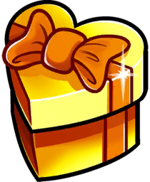
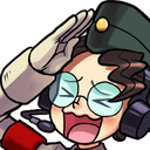
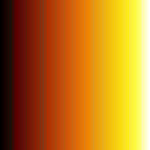
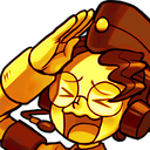


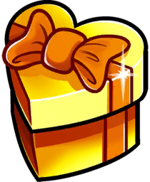
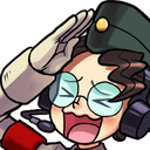
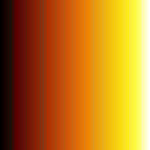
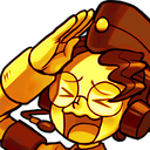

Gold-Gift Gradient Map extracted in 0.040 seconds and applied in 0.010 seconds.


In [2]:
goldgift = Image.open('./input/GiftIcon_Gold.png')
molly = Image.open('./input/molly.png')

t0 = time()
goldmap = getGradientMap(goldgift)
t1 = time()
goldmolly = applyGradientMap(molly, goldmap)
t2 = time()

goldgradient = getGradientMap(goldgift, justcompare=True)
show(
    [goldgift, molly, goldgradient, goldmolly],
    ['(210×256)', '(128×128)', '(256×256)', '(128×128)'],
    ['GiftIcon_Gold.png', 'molly.png', 'gradient extracted from GiftIcon_Gold.png', 'gradient extracted from GiftIcon_Gold.png applied to molly.png']
)
print('Gold-Gift Gradient Map extracted in {:.3f} seconds and applied in {:.3f} seconds.'.format(t1 - t0, t2 - t1))

Any missing intensity values are filled in by taking a weighted average of the existing intensity values scaled exponentially by similarity (distance in the gradient).

In the first gradient below, the bottom half of the gradient shows missing intensity values as green lines and the top half shows the completed gradient after filling them in from the surrounding colors.

Scaling up the input can also fill in missing values, as shown below in the second gradient. This gives a smoother result too, which yields a better output when applying the gradient to another image.


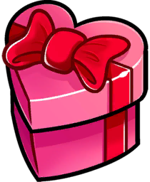
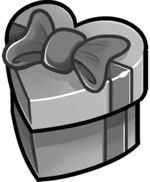
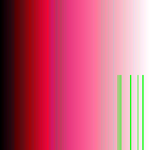
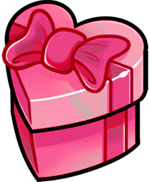
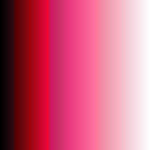
...
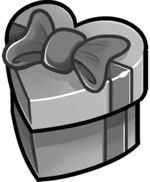
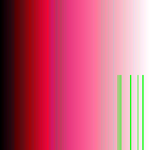
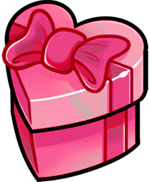
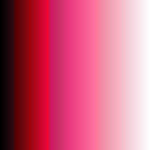
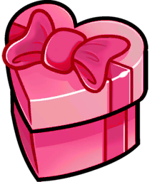

Pink-Gift Gradient Map extracted in 0.050 seconds and applied in 0.065 seconds.
Scaled-Up-Pink-Gift Gradient Map extracted in 0.149 seconds and applied in 0.025 seconds.


In [3]:
pinkgift = Image.open('./input/GiftIcon_Standard.png')
greygift = Image.open('./input/GiftIcon_Grey.png')

t0 = time()
pinkmap = getGradientMap(pinkgift)
t1 = time()
ungrey = applyGradientMap(greygift, pinkmap)
t2 = time()
pinkmap2 = getGradientMap(pinkgift, 2)
t3 = time()
ungrey2 = applyGradientMap(greygift, pinkmap2)
t4 = time()

pinkgradient = getGradientMap(pinkgift, justcompare=True)
pinkgradient2 = getGradientMap(pinkgift, 2, justcompare=True)
show(
    [pinkgift, greygift, pinkgradient, ungrey, pinkgradient2, ungrey2],
    ['(210×256)', '(210×256)', '(256×256)', '(210×256)', '(256×256)', '(210×256)'],
    ['GiftIcon_Standard.png', 'GiftIcon_Grey.png', 'gradient extracted from GiftIcon_Standard.png', 'gradient extracted from GiftIcon_Standard.png applied to GiftIcon_Grey.png', 'gradient extracted from GiftIcon_Standard.png scaled by 2', 'gradient extracted from GiftIcon_Standard.png scaled by 2 applied to GiftIcon_Grey.png']
)
print('Pink-Gift Gradient Map extracted in {:.3f} seconds and applied in {:.3f} seconds.'.format(t1 - t0, t2 - t1))
print('Scaled-Up-Pink-Gift Gradient Map extracted in {:.3f} seconds and applied in {:.3f} seconds.'.format(t3 - t2, t4 - t3))

Since there are only 256 intensity values, inputs with larger image dimensions should affect the execution time of gradient extraction and application by a few seconds at most. The runtime scales linearly, proportional to the number of pixels in the image.


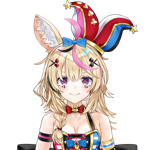
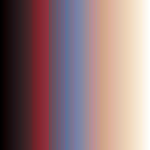
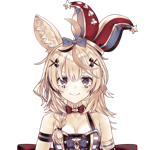


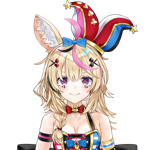
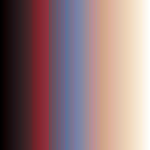
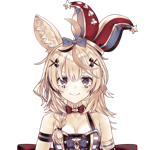

Polka Gradient Map extracted in 4.729 seconds and applied in 5.174 seconds.


In [4]:
pol = Image.open('./input/pol.png')

t0 = time()
polmap = getGradientMap(pol)
t1 = time()
polpol = applyGradientMap(pol, polmap)
t2 = time()

polgradient = getGradientMap(pol, justcompare=True)
show(
    [pol, polgradient, polpol],
    ['(3061×3061)', '(256×256)', '(3061×3061)'],
    ['pol.png', 'gradient extracted from pol.png', 'gradient extracted from pol.png applied to pol.png']
)
print('Polka Gradient Map extracted in {:.3f} seconds and applied in {:.3f} seconds.'.format(t1 - t0, t2 - t1))

## color_transfer.py
This takes two color variations of an image to create a correspondence mapping that can be applied to similarly colored images.


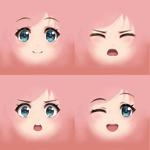
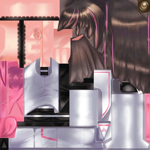
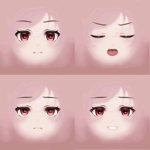
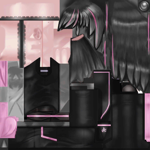


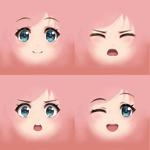
...
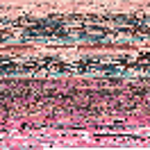


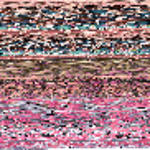
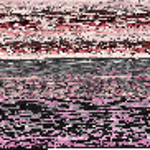
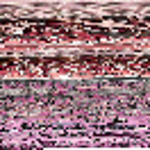
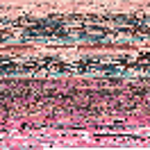

Kizuna-AI-to-Black-AI Color Map (k2b) initialized in 0.783 seconds.
Black-AI-to-Kizuna-AI Color Map (b2k) initialized in 0.696 seconds.


In [5]:
kface = Image.open('./input/ai/unit_model_804_02_face_texture.png')
kbody = Image.open('./input/ai/unit_model_804_02_texture.png')
bface = Image.open('./input/ai/unit_model_804_03_face_texture.png')
bbody = Image.open('./input/ai/unit_model_804_03_texture.png')

t0 = time()
k2b = ColorMap()
k2b.addMultiple([(kface, bface), (kbody, bbody)])
t1 = time()
b2k = ColorMap()
b2k.addMultiple([(bface, kface), (bbody, kbody)])
t2 = time()

k2bmapk, k2bmapb = k2b.dumpSparseMap()
b2kmapb, b2kmapk = b2k.dumpSparseMap()
show(
    [kface, kbody, bface, bbody],
    ['(512×512)', '(512×512)', '(512×512)', '(512×512)'],
    ['unit_model_804_02_face_texture.png (kface)', 'unit_model_804_02_texture.png (kbody)', 'unit_model_804_03_face_texture.png (bface)', 'unit_model_804_03_texture.png (bbody)']
)
show(
    [k2bmapk, k2bmapb, b2kmapb, b2kmapk],
    ['({} pixels)'.format(len(k2b.sparsemap)), '({} pixels)'.format(len(k2b.sparsemap)), '({} pixels)'.format(len(b2k.sparsemap)), '({} pixels)'.format(len(b2k.sparsemap))],
    ['all colors in kface+kbody', 'colors in bface+bbody corresponding to the colors in kface+kbody', 'all colors in bface+bbody', 'colors in kface+kbody corresponding to the colors in bface+bbody']
)
print('Kizuna-AI-to-Black-AI Color Map (k2b) initialized in {:.3f} seconds.'.format(t1 - t0))
print('Black-AI-to-Kizuna-AI Color Map (b2k) initialized in {:.3f} seconds.'.format(t2 - t1))

With the large amount of time it takes to apply a color map, it's a good idea to check quality before proceeding. To do so, simply apply the color map to its reference image(s) and compare. This is the quickest way since there aren't any new colors to calculate; it's a mere dictionary call for every pixel.

The results below for k2b look decent, but b2k does not. Although disappointing, it would be better to abandon b2k now.


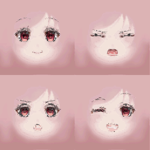
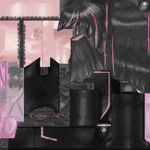
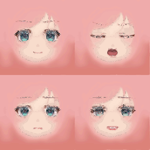
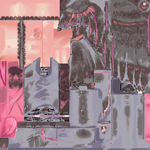


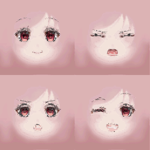
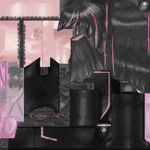
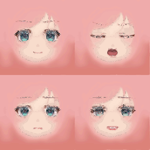
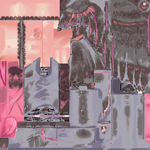

Two k2b and two b2k applications performed in 0.807 seconds.


In [6]:
t0 = time()
k2bface = k2b.apply(kface)
k2bbody = k2b.apply(kbody)
b2kface = b2k.apply(bface)
b2kbody = b2k.apply(bbody)
t1 = time()

show(
    [k2bface, k2bbody, b2kface, b2kbody],
    ['(512×512)', '(512×512)', '(512×512)', '(512×512)'],
    ['k2b applied to kface', 'k2b applied to kbody', 'b2k applied to bface', 'b2k applied to bbody']
)
print('Two k2b and two b2k applications performed in {:.3f} seconds.'.format(t1 - t0))

Unlike gradient_transfer.py which has just 256 intensity values to store, color_transfer.py has to deal with 256³ = 16,777,216 possible color values. 

Calculating the mapping of a new color thus takes a lot of time, so missing values are not immediately filled in on initialization. Color values are instead calculated and memoized as needed whenever the color map is applied. Note below how the amount of stored color correspondences increase in k2b and b2k.

(Also note how terrible b2k is, as predicted earlier. b2k will not be used in any further examples.)


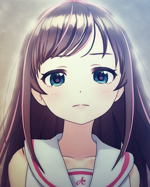
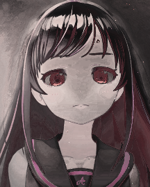
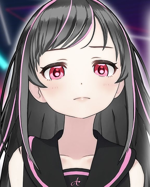
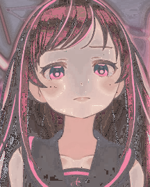


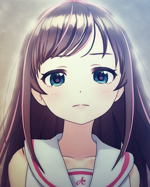
...
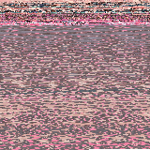


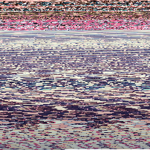
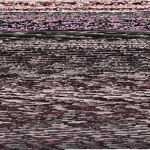
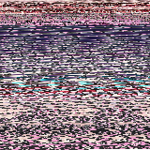
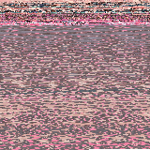

k2b applied in 186.589 seconds.
b2k applied in 59.299 seconds.


In [7]:
artist = Image.open('./input/ai/artistprofile.png')
melty = Image.open('./input/ai/meltyworld.png')

t0 = time()
k2bartist = k2b.apply(artist, 0.27)
t1 = time()
b2kmelty = b2k.apply(melty, 0.375)
t2 = time()

k2bmapk2, k2bmapb2 = k2b.dumpMemoMap()
b2kmapb2, b2kmapk2 = b2k.dumpMemoMap()
show(
    [artist, k2bartist, melty, b2kmelty],
    ['(800×1000)', '(216×270)', '(576×720)', '(216×270)'],
    ['artistprofile.png', 'k2b applied to artistprofile.png', 'meltyworld.png', 'b2k applied to meltyworld.png']
)
show(
    [k2bmapk2, k2bmapb2, b2kmapb2, b2kmapk2],
    ['({} pixels)'.format(len(k2b.memomap)), '({} pixels)'.format(len(k2b.memomap)), '({} pixels)'.format(len(b2k.memomap)), '({} pixels)'.format(len(b2k.memomap))],
    ['all colors in kface+kbody plus artistprofile.png', 'corresponding colors in bface+bbody plus colors mapped from artistprofile', 'all colors in bface+bbody plus meltyworld.png', 'corresponding colors in kface+kbody plus colors mapped from meltyworld']
)
print('k2b applied in {:.3f} seconds.'.format(t1 - t0))
print('b2k applied in {:.3f} seconds.'.format(t2 - t1))

I went through several iterations to try to reduce the amount of time needed to estimate a color mapping. These are available upon application as methods 0-4.

|Method|0|1|2|3|4|
|-|-|-|-|-|-|
|Speed|★☆☆☆☆|★★★☆☆|★★★★☆|★★★★★|★★★★★|
|Quality|★★★★☆|★★★★★|★★★★★|★★★☆☆|★☆☆☆☆|

Method 0 copies exactly what gradient_transfer.py does, calculating a weighted average from all of the initialized colors scaled exponentially by similarity. As expected, this method takes the longest to execute.

Method 1 groups the initialized colors by their similarity to the input color, sorts them to find the closest 16 groups, and calculates an average from those groups' colors. Even though this requires an additional dictionary and sorted array, it takes a lot less time than method 0. The quality is consistent and often better than method 0, so this is the default method.

Method 2 attempts to hasten method 1 by forgoing the dictionary. It sorts the initialized colors by similarity and  calculates an average from the top 100th of them. It is a little faster, but the lack of groupings means a lack of consistency with the last part of that 100th. This shouldn't matter too much with a large amount of initialized colors though.

Method 3 does what method 0 does, but only includes initialized colors with a similarity of 16 or better. If there are none, it reruns with a doubled similarity threshhold. This is the fastest method since it doesn't rely on extra dictionaries or arrays or sorting. It also typically yields quality comparable to method 0 since the weight formula gives dissimilar colors such a small weight anyway.

Method 4 tries to do what method 3 does without ever needing to rerun and without the costly weight formula. During the loop, it remembers the closest color and accumulates other colors if they are of a similarity of 16 or better from that color. Whenever it runs into a color that is closer to the input color than the currently remembered closest color, it resets the accumlation and continues on with the new closest color. After the loop ends, it averages the accumulated colors. This method is about the same speed as method 3 and the resulting output isn't as good, so this method is not recommended.


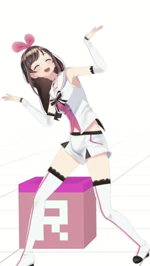
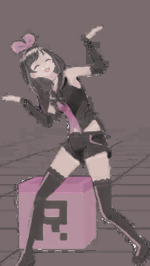
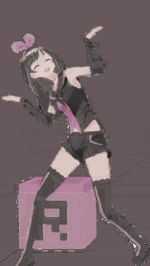
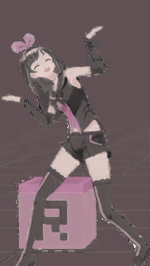
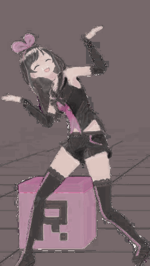
...
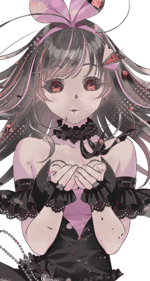
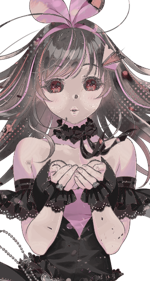
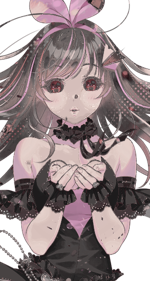
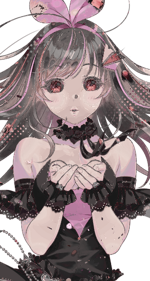
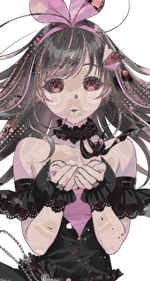

In [8]:
terr = Image.open('./input/ai/terribleautotranslation.png')
ap19 = Image.open('./input/ai/aiparty2019.png')

saver = []
for img in [terr, ap19]:
    scale = 300 / min(img.size)
    ttls = ['({}×{})'.format(*img.size)]
    lbls = ['Input']
    imgs = [img]
    for method in range(5):
        k2b.initMaps() # clear memoized color mappings
        t0 = time()
        m = k2b.apply(img, scale, method)
        t1 = time()
        ttls.append('({}×{})'.format(*m.size))
        lbls.append('Method {}: {:.1f} seconds'.format(method, t1 - t0))
        imgs.append(m)
        saver.append(m)
    show(imgs, ttls, lbls)

Another way to reduce the execution time of color map application is by scaling down the images used in initialization. Unlike gradient_transfer.py, scaling down the initialization images does not downgrade the color map too much and may even provide better results.


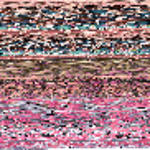
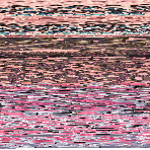
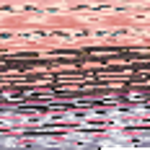
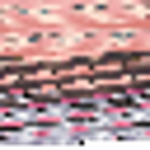
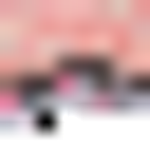


...
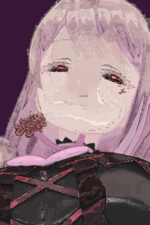
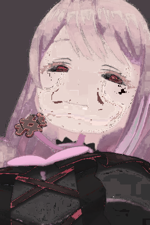
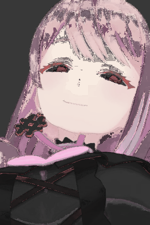
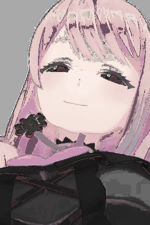
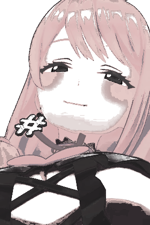

In [9]:
high = Image.open('./input/ai/highrangetest.png')
love = Image.open('./input/ai/love.png')

cms = []
ttls = []
lbls = []
imgs = []
for i, scale in enumerate([1, 0.5, 0.1, 0.05, 0.01]):
    cm = ColorMap()
    cm.addMultiple([(kface, bface), (kbody, bbody)], scale)
    cms.append(cm)
    ttls.append('({} pixels)'.format(len(cm.sparsemap)))
    lbls.append('Color Map {} (initialized with Input×{})'.format(i, scale))
    imgs.append(cm.dumpSparseMap()[0])
    saver.append(cm.dumpSparseMap()[0])
show(imgs, ttls, lbls)

for img in [high, love]:
    scale = 300 / min(img.size)
    ttls = ['({}×{})'.format(*img.size)]
    lbls = ['Input']
    imgs = [img]
    for i, cm in enumerate(cms):
        cm.initMaps() # clear memo
        t0 = time()
        m = cm.apply(img, scale, method=3)
        t1 = time()
        ttls.append('({}×{})'.format(*m.size))
        lbls.append('Map {}: {:.1f} seconds'.format(i, t1 - t0))
        imgs.append(m)
        saver.append(m)
    show(imgs, ttls, lbls)

(I assume the increase in initialized colors in Map 1 is due to the resampling filter.)

Now let's try all methods and all scales shown above applied to the artist profile picture to see how the script handles an image with a slightly different color palette.

All images below are of size (216×270).



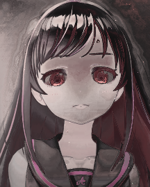
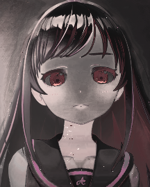
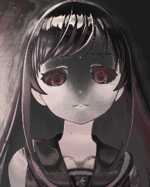
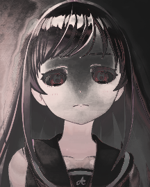
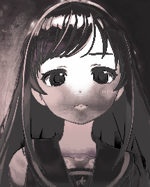


...


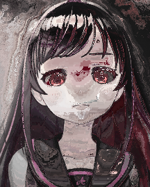
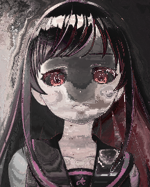
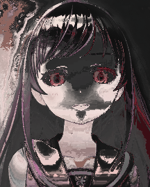
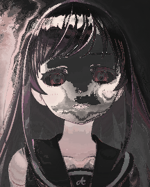
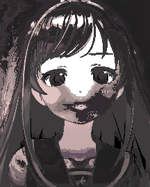

In [10]:
print('All images below are of size (216×270).')
for method in range(5):
    ttls = []
    lbls = []
    imgs = []
    for i, cm in enumerate(cms):
        cm.initMaps() # clear memo
        t0 = time()
        m = cm.apply(artist, 0.27, method)
        t1 = time()
        ttls.append('Method {} on Map {}'.format(method, i))
        lbls.append('{:.1f} seconds'.format(t1 - t0))
        imgs.append(m)
        saver.append(m)
    show(imgs, ttls, lbls)

## Other Scripts
- **gild_sprites.py** uses gradient_transfer.py to turn unpalettized Skullgirls Mobile portraits gold.
- **color_storage_test.py** tests efficiency of different structures for color storage for color_transfer.py.

In [11]:
# for the README.md copy
goldgradient.save('./readme/goldgradient.png')
goldmolly.save('./readme/goldmolly.png')
pinkgradient.save('./readme/pinkgradient.png')
ungrey.save('./readme/ungrey.png')
pinkgradient2.save('./readme/pinkgradient2.png')
ungrey2.save('./readme/ungrey2.png')
polgradient.save('./readme/polgradient.png')
polpol.save('./readme/polpol.png')
k2bmapk.save('./readme/k2bmapk.png')
k2bmapb.save('./readme/k2bmapb.png')
b2kmapb.save('./readme/b2kmapb.png')
b2kmapk.save('./readme/b2kmapk.png')
k2bface.save('./readme/k2bface.png')
k2bbody.save('./readme/k2bbody.png')
b2kface.save('./readme/b2kface.png')
b2kbody.save('./readme/b2kbody.png')
k2bartist.save('./readme/k2bartist.png')
b2kmelty.save('./readme/b2kmelty.png')
k2bmapk2.save('./readme/k2bmapk2.png')
k2bmapb2.save('./readme/k2bmapb2.png')
b2kmapb2.save('./readme/b2kmapb2.png')
b2kmapk2.save('./readme/b2kmapk2.png')
for i, img in enumerate(saver):
    img.save('./readme/saver{}.png'.format(i))